In [1]:
import time
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm, trange

# Big Data 📊

In [3]:
big_data.drop(columns=['minutes', 'contributor_id', 'tags', 'nutrition', 'n_steps', 'submitted', 'steps', 'description'], inplace=True)
big_data.head()

,name,id,ingredients,n_ingredients
0,arriba baked winter squash mexican style,137739,"['winter squash', 'mexican seasoning', 'mixed ...",7
1,a bit different breakfast pizza,31490,"['prepared pizza crust', 'sausage patty', 'egg...",6
2,all in the kitchen chili,112140,"['ground beef', 'yellow onions', 'diced tomato...",13
3,alouette potatoes,59389,"['spreadable cheese with garlic and herbs', 'n...",11
4,amish tomato ketchup for canning,44061,"['tomato juice', 'apple cider vinegar', 'sugar...",8


In [4]:
big_data.shape

(231637, 4)

In [5]:
big_data.dtypes

name             object
id                int64
ingredients      object
n_ingredients     int64
dtype: object

## Agenda

#### Introduction

- Verify the biggest array of Ingredients (Word2Vec, window=X)
- Vectorize each Word of Ingredients
- Add Column Ingredients Vectorized
- Average the Ingredients array into a single Vector
- Add a Column Vector Average
- Verify How many unique vectors exist in our dataset: Vocabulary Size

#### Dimensionality Reduction

- Principal Component Analysis or T-Distributed Stochastic Neighbouring Entities (T-SNE)

#### Clustering

- Run K-Means Unsupervised Learning Algorithm for each Ingredient (Word)
- Run K-Means Unsupervised Learning Algorithm for whole Ingredients Average

#### Model Tuning

- Tryout other Models likewise Doc2Vec and FastText to compare performance
- GridSearch and RandomSearch for params optimization

In [6]:
import ast

In [7]:
ast.literal_eval(big_data['ingredients'].max())

['zwieback toast',
 'light brown sugar',
 'butter',
 'cream cheese',
 'granulated sugar',
 'eggs',
 'pumpkin',
 'pumpkin pie spice',
 'vanilla extract',
 'heavy cream',
 'pecans']

In [8]:
ingredients = []
for ingredients_list in big_data.ingredients:
    ingredients_arr = ast.literal_eval(ingredients_list)
    ingredients_arr = sorted(ingredients_arr)
    ingredients.append(ingredients_arr)

In [9]:
big_data['ingredients'] = ingredients

In [10]:
big_data.head()

,name,id,ingredients,n_ingredients
0,arriba baked winter squash mexican style,137739,"[butter, honey, mexican seasoning, mixed spice...",7
1,a bit different breakfast pizza,31490,"[cheese, eggs, milk, prepared pizza crust, sal...",6
2,all in the kitchen chili,112140,"[cheddar cheese, chili powder, diced tomatoes,...",13
3,alouette potatoes,59389,"[new potatoes, olive oil, parsley, pepper, red...",11
4,amish tomato ketchup for canning,44061,"[apple cider vinegar, cinnamon oil, clove oil,...",8


## 👉 It seems Word2Vec demands to be trained before vectorizing words

In [11]:
from gensim.models import Word2Vec

- 👉 Word2Vec recieves a list of lists as an argument
- 👉 Being each list inside the bigger list a list of words, as type of strings

## 👉 Sort words alphabetically

In [12]:
len(big_data['ingredients'])

231637

In [13]:
word2vec = Word2Vec(sentences=big_data.ingredients, window=11, min_count=1)

In [14]:
word2vec.wv['eggs']

array([ 0.10942341, -2.0877993 ,  2.256951  ,  0.34298256,  1.4172136 ,
       -0.48197153,  0.42056382, -1.7069862 ,  0.24488258,  0.57372606,
       -0.65639806,  1.7938215 ,  1.3395377 , -1.6483445 ,  0.9807541 ,
        1.2973986 ,  0.8130151 ,  1.301281  ,  2.3086295 ,  2.2512488 ,
       -0.34611717,  0.09167147,  1.3636854 ,  2.43781   , -0.47269768,
        1.1302841 ,  2.502925  ,  0.06859285,  0.18786845,  2.8229024 ,
       -0.94530225,  2.1324837 , -1.7004781 , -0.4236513 , -0.4731382 ,
        2.5406437 , -0.05710433, -2.4184642 ,  0.31358847, -0.6109985 ,
       -0.49269256,  1.593326  , -0.51788163, -0.72720164,  0.5733459 ,
        1.2510142 , -0.22831187,  0.06514916,  1.5365282 , -2.5739644 ,
        0.441476  , -1.667102  ,  2.7816846 ,  1.5144336 ,  0.9361671 ,
        1.4163287 ,  0.65139097, -0.32247356,  0.07976387, -1.2017283 ,
        1.2924156 ,  1.2583855 , -2.7731419 , -0.9854738 , -1.9422174 ,
       -1.1657776 ,  1.092355  ,  1.2986677 , -1.7039421 ,  0.00

In [46]:
word2vec.wv.most_similar('eggs')

[('egg', 0.9083143472671509),
 ('extra large eggs', 0.5848203897476196),
 ('egg yolk', 0.48084431886672974),
 ('egg whites', 0.4787013828754425),
 ('egg white', 0.4762691259384155),
 ('egg substitute', 0.45288050174713135),
 ('egg yolks', 0.40391892194747925),
 ('nestle dark chocolate and mint morsels', 0.3893817961215973),
 ('egg beaters egg substitute', 0.3599860370159149),
 ('extra-large eggs', 0.3567848801612854)]

In [16]:
def get_wv_vec(ingredients, word2vec):
    w2v_i = []
    vocabulary = []
    for ingredients_list in ingredients:
        ingredients_w2v = []
        for word in ingredients_list:
            word = word2vec.wv[word]
            vocabulary.append(word)
            ingredients_w2v.append(word)
        w2v_i.append(ingredients_w2v)
    return w2v_i, vocabulary

In [17]:
w2v_i, vocabulary = get_wv_vec(big_data.ingredients, word2vec)

In [18]:
type(w2v_i), len(w2v_i)

(list, 231637)

In [19]:
type(vocabulary), len(vocabulary)

(list, 2096582)

In [20]:
big_data.shape

(231637, 4)

In [21]:
big_data['ingredients_word2vec'] = w2v_i

In [22]:
big_data.head()

,name,id,ingredients,n_ingredients,ingredients_word2vec
0,arriba baked winter squash mexican style,137739,"[butter, honey, mexican seasoning, mixed spice...",7,"[[-2.3419166, 0.9285648, -0.5354416, 1.3541702..."
1,a bit different breakfast pizza,31490,"[cheese, eggs, milk, prepared pizza crust, sal...",6,"[[0.9325569, -0.35128152, -1.217522, -0.881005..."
2,all in the kitchen chili,112140,"[cheddar cheese, chili powder, diced tomatoes,...",13,"[[1.1353292, 1.6405444, -0.9359941, -0.6166214..."
3,alouette potatoes,59389,"[new potatoes, olive oil, parsley, pepper, red...",11,"[[-1.207242, -0.1542747, -0.31802517, 0.443121..."
4,amish tomato ketchup for canning,44061,"[apple cider vinegar, cinnamon oil, clove oil,...",8,"[[1.1030298, 1.4975662, -0.5814419, -0.6901564..."


-------------------------------

## Getting Vocabulary Dict

In [23]:
def get_wv_vec_dic(ingredients, word2vec):
    w2v_i = []
    vocabulary = {}
    for ingredients_list in ingredients:
        ingredients_w2v = []
        for word in ingredients_list:
            word_vec = word2vec.wv[word]
            vocabulary[word] = word_vec
            ingredients_w2v.append(word)
        w2v_i.append(ingredients_w2v)
    return w2v_i, vocabulary

In [24]:
w2v_ii, vocabulary_dict = get_wv_vec_dic(big_data.ingredients, word2vec)

In [25]:
vocabulary_dictator = pd.DataFrame.from_dict(vocabulary_dict)

In [26]:
vocabulary_dictator.head()

,butter,honey,mexican seasoning,mixed spice,olive oil,salt,winter squash,cheese,eggs,milk,...,low-fat low-sodium condensed cream of tomato soup,thousand island sandwich spread,pesto garlic tortillas,roasted red pepper pesto,seasoned rice vinegar with roasted garlic,apricot jell-o,hunt's fire roasted diced tomatoes,rosarita premium whole black beans,skinless halibut fillet,nepitella
0,-2.341917,0.170080,0.114598,-0.586963,-1.652301,-0.797689,-0.430452,0.932557,0.109423,0.680564,...,-0.017591,0.001515,-0.025436,-0.025549,-0.001621,-0.012276,-0.010232,-0.010269,-0.007631,-0.033892
1,0.928565,1.151156,0.163793,-0.227343,0.248799,1.060581,-0.097345,-0.351282,-2.087799,-0.640497,...,0.001228,0.003063,0.012685,0.005540,0.009790,0.019894,0.024487,0.022260,-0.039886,-0.020097
2,-0.535442,1.084083,0.016217,-0.154014,0.406695,-0.664836,-0.049497,-1.217522,2.256951,0.184525,...,0.012172,0.012964,0.025746,0.024976,0.009971,0.002131,0.014605,0.005912,0.012430,0.031069
3,1.354170,-0.995216,0.126795,0.059245,-1.008343,-1.492571,-0.099302,-0.881006,0.342983,0.431132,...,0.009678,0.020902,0.010518,0.009855,-0.006567,0.004763,0.030047,0.027509,0.011726,0.017913
4,3.528234,-0.524832,-0.233497,0.281428,-3.066528,0.420679,-0.189937,-0.164112,1.417214,0.992757,...,-0.006223,-0.003280,0.012041,0.010675,-0.012978,0.004729,0.011888,0.007855,0.009589,0.015163


In [27]:
vocabulary_dictator.shape

(100, 14942)

In [28]:
Xp = vocabulary_dictator.T
Xp.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
butter,-2.341917,0.928565,-0.535442,1.354170,3.528234,-0.494395,0.993205,-2.738266,-1.061238,-0.128934,...,-0.767146,0.553837,2.260076,-1.212821,-0.890678,1.333912,-0.316358,1.382993,-0.215774,0.527831
honey,0.170080,1.151156,1.084083,-0.995216,-0.524832,-0.079517,0.232880,0.114583,1.919104,0.217333,...,-0.535753,-1.263264,-1.075310,-1.236840,-0.594610,0.674306,-1.709633,-1.393949,-0.434493,-0.555475
mexican seasoning,0.114598,0.163793,0.016217,0.126795,-0.233497,0.240329,0.011293,-0.032362,-0.006244,0.025354,...,0.001495,-0.128054,-0.042574,0.189765,0.109506,-0.015155,0.003350,-0.196466,-0.017127,0.174173
mixed spice,-0.586963,-0.227343,-0.154014,0.059245,0.281428,-0.721691,0.233801,0.170451,-0.302127,-0.578575,...,1.008906,0.589969,-0.578018,-0.084012,0.917853,0.671122,-0.115436,-0.219234,-0.007307,0.020185
olive oil,-1.652301,0.248799,0.406695,-1.008343,-3.066528,-0.382854,2.670920,-1.426617,0.311465,0.968996,...,0.708117,-0.971016,1.160755,0.750778,0.930080,2.609773,-0.339313,-1.545978,0.944296,1.334431


In [29]:
Xp.shape

(14942, 100)

<AxesSubplot:>

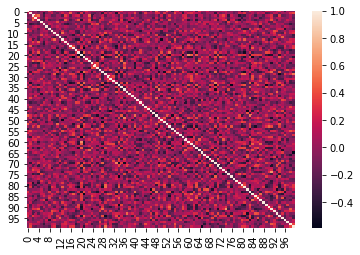

In [30]:
sns.heatmap(pd.DataFrame(Xp).corr())

-----------------

# Principal Component Analysis (PCA) 🔧

In [31]:
from sklearn.decomposition import PCA

In [32]:
pca = PCA()
pca.fit(Xp)

PCA()

<AxesSubplot:>

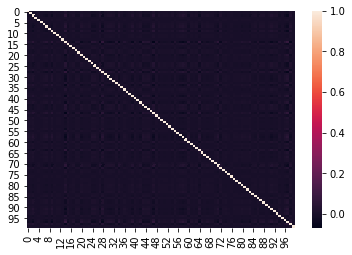

In [33]:
pca_com = pd.DataFrame(pca.components_)
sns.heatmap(pd.DataFrame(pca_com).corr())

In [34]:
sns.heatmap(pd.DataFrame(vocabulary_dictator).corr())

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/home/vitor/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-34-3887bc862725>", line 1, in <module>
    sns.heatmap(pd.DataFrame(vocabulary_dictator).corr())
  File "/home/vitor/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/seaborn/_decorators.py", line 46, in inner_f
    return f(**kwargs)
  File "/home/vitor/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/seaborn/matrix.py", line 535, in heatmap
    plotter = _HeatMapper(data, vmin, vmax, cmap, center, robust, annot, fmt,
  File "/home/vitor/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/seaborn/matrix.py", line 155, in __init__
    self._determine_cmap_params(plot_data, vmin, vmax,
  File "/home/vitor/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/seaborn/matrix.py", line 189, in _

TypeError: object of type 'NoneType' has no len()

# Clustering with K-Means Algorithm 🪐

In [35]:
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans

In [36]:
kmeans = KMeans()

In [37]:
final_df = pca.transform(Xp)
final_df = pd.DataFrame(final_df)
final_df.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-0.274761,-1.956975,-3.510908,-1.702580,-2.299203,-0.976366,-1.127077,-1.216695,0.412071,-1.221318,...,-0.037165,0.044593,0.051605,0.087944,0.091323,-0.078203,0.094764,0.067733,-0.057035,-0.065551
1,0.126089,4.823299,-0.697325,0.276648,-1.794670,-1.864862,3.852980,0.661834,0.633202,0.655834,...,0.042800,0.102752,-0.095943,0.034190,-0.034700,-0.084171,-0.082978,-0.030623,0.060495,-0.001824
2,-0.140212,-0.291377,0.806209,0.317771,0.060632,0.575176,0.180111,0.123652,-0.068472,0.084882,...,0.002916,-0.002355,-0.002916,0.004939,0.009947,-0.001621,0.007324,-0.001419,-0.001764,0.005307
3,1.710687,2.849308,-1.544457,-2.613673,1.620358,0.455247,-0.905969,2.239738,-0.392736,0.846699,...,0.022518,0.026398,0.012670,0.033235,0.037193,0.028122,-0.005187,0.005394,-0.009772,-0.003922
4,-6.804179,2.511716,-2.099221,1.388870,1.311815,1.237007,0.840341,0.224227,-0.172761,0.447299,...,-0.189529,-0.088012,0.057075,-0.020282,-0.095571,-0.047450,-0.056719,0.045549,-0.011887,-0.023257


In [38]:
final_df.set_index(Xp.index, inplace=True)
final_df.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
butter,-0.274761,-1.956975,-3.510908,-1.702580,-2.299203,-0.976366,-1.127077,-1.216695,0.412071,-1.221318,...,-0.037165,0.044593,0.051605,0.087944,0.091323,-0.078203,0.094764,0.067733,-0.057035,-0.065551
honey,0.126089,4.823299,-0.697325,0.276648,-1.794670,-1.864862,3.852980,0.661834,0.633202,0.655834,...,0.042800,0.102752,-0.095943,0.034190,-0.034700,-0.084171,-0.082978,-0.030623,0.060495,-0.001824
mexican seasoning,-0.140212,-0.291377,0.806209,0.317771,0.060632,0.575176,0.180111,0.123652,-0.068472,0.084882,...,0.002916,-0.002355,-0.002916,0.004939,0.009947,-0.001621,0.007324,-0.001419,-0.001764,0.005307
mixed spice,1.710687,2.849308,-1.544457,-2.613673,1.620358,0.455247,-0.905969,2.239738,-0.392736,0.846699,...,0.022518,0.026398,0.012670,0.033235,0.037193,0.028122,-0.005187,0.005394,-0.009772,-0.003922
olive oil,-6.804179,2.511716,-2.099221,1.388870,1.311815,1.237007,0.840341,0.224227,-0.172761,0.447299,...,-0.189529,-0.088012,0.057075,-0.020282,-0.095571,-0.047450,-0.056719,0.045549,-0.011887,-0.023257


In [39]:
kmeans.fit(final_df)

KMeans()

Text(0, 0.5, 'PC 2')

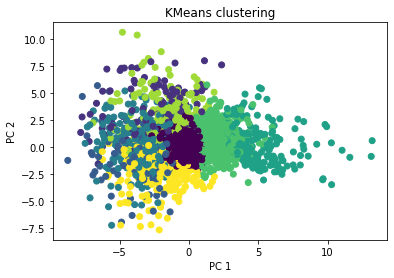

In [40]:
plt.scatter(final_df[0], final_df[1], c=kmeans.labels_)
plt.title('KMeans clustering'); plt.xlabel('PC 1'); plt.ylabel('PC 2')

/home/vitor/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


Text(0, 0.5, 'PC 2')

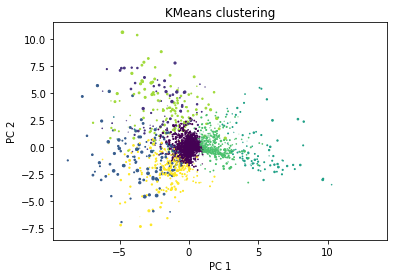

In [41]:
plt.scatter(final_df[0], final_df[1], final_df[2], c=kmeans.labels_)
plt.title('KMeans clustering'); plt.xlabel('PC 1'); plt.ylabel('PC 2')

In [42]:
import plotly.express as px
fig = px.scatter(x=final_df[0], y=final_df[1], color=kmeans.labels_, hover_name=final_df.index)
fig.show()

In [43]:
fig = px.scatter_3d(x=final_df[0], y=final_df[1], z=final_df[2], color=kmeans.labels_, hover_name=final_df.index)
fig.show()

In [47]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from scipy import stats

## Chasser La'assot:

- KMeans Elbow Method for findind best n_clusters param
- Grid / Randomized Search for Fine Tuning
- Method to compare KMeans Clustering x Word2Vec most_similar_
- Discover if PCA must do on Xp (vocab.T) or vocab (rows x columns)

In [51]:
stats.uniform(0,1)

In [ ]:
# ks = range(300,500)
# inertias = []
# for k in ks:
#     km_test = KMeans(n_clusters=k).fit(Xp)
#     inertias.append(km_test.inertia_)
# plt.plot(ks, inertias)
# plt.xlabel('k cluster number')

In [ ]:
%%time
grid = {'n_clusters': [30, 50, 100, 300],
        # 'n_init': [10,50,100],
        'max_iter': [500, 800],
        'algorithm': ['full', 'elkan'],
        'tol': [0.001]}

random = RandomizedSearch()
random.fit(final_df)

In [ ]:
search.best_estimator_